## Phenotype performance
Quantifying performance of different trait combinations in terms of __yield__ & __yield variance__

In [251]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn.preprocessing as preprocessing
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader

from ideotype.data_process import read_data, agg_sims
from ideotype.analysis import run_pca

### 1: Load in data

In [6]:
# read in data
yamlfile = '/home/disk/eos8/ach315/ideotype/ideotype/data/files/filepaths_opt.yml'
df_sims, df_sites, df_wea, df_params, df_all, df_matured = read_data(yamlfile)

In [16]:
# aggregate data
df = df_all
groups = ['cvar', 'site']
mx_mean = agg_sims(df, groups, 'mean')
mx_variance = agg_sims(df, groups, 'variance')
mx_disp = np.divide(mx_variance, mx_mean)

### Calculating yield mean & yield variance:

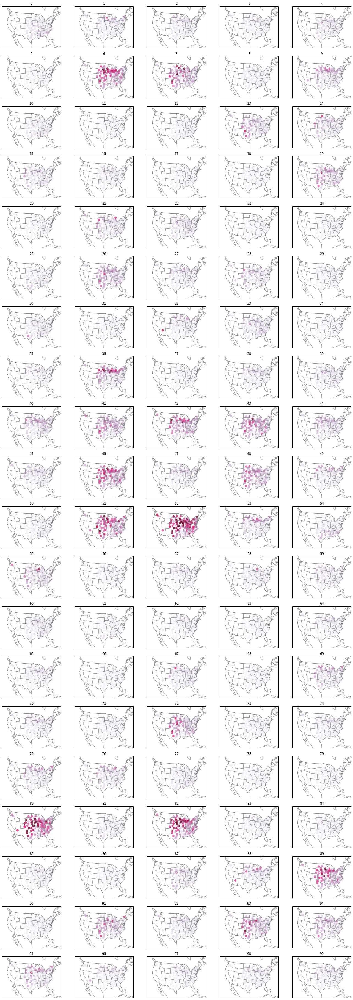

In [9]:
# Yield variance across sites for all cultivars
site_mean = df_all.groupby(['cvar', 'site']).mean().dm_ear
site_var = df_all.groupby(['cvar', 'site']).var().dm_ear

fig = plt.figure(figsize=(20,50))

for i in np.arange(100):
    ax = fig.add_subplot(20, 5, i+1, projection=ccrs.AlbersEqualArea(
                         central_latitude=39.5, central_longitude=-98.35))
    ax.set_extent([-123, -72, 19, 53])
    ax.scatter(site_lon, site_lat, c=site_var[(i)],
               transform=ccrs.PlateCarree(), s=50,
               cmap='PuRd', alpha=0.8,
               vmin=0, vmax=1000)
    ax.add_feature(cfeature.BORDERS, edgecolor='grey')
    ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
    ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)
    ax.set_title(i)

fig.subplots_adjust(left=0.05, bottom=0, right=0.95, top=1, wspace=0.1, hspace=0.2)

In [ ]:
# looking at actual mean & variance for each cultivar
for cvar in np.arange(100):
    var_mean = df_all.groupby(['cvar', 'year']).var().query('cvar==' + str(cvar)).dm_ear.mean()
    var_se = stats.sem(df_all.groupby(['cvar', 'year']).var().query('cvar==' + str(cvar)).dm_ear)
#    print(var_mean, var_se)

### Cultivars that give highest yield at each site

In [103]:
# Search for cultivars that gives highest yield at each site
maxyield_cvar = []
maxyield_sites = []

for site in df_sites.site:
    try:
        df_site = pd.DataFrame(df_all.groupby(['site', 'cvar']).mean().query(f'site=="{site}"').dm_ear)
        maxyield_sites.append(df_site.idxmax().dm_ear[0])
        maxyield_cvar.append(df_site.idxmax().dm_ear[1])
    except:
        print(site)

df_maxyield_cvar = pd.DataFrame({'site': maxyield_sites,
                                 'cvar': maxyield_cvar}).merge(df_sites)

727815


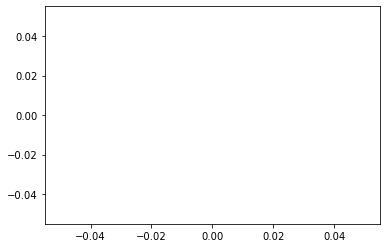

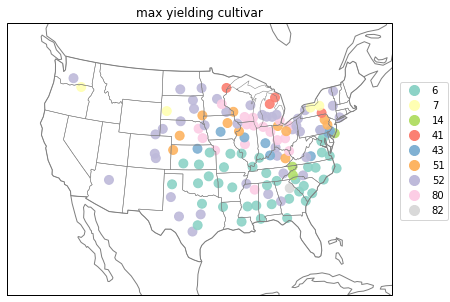

In [192]:
# scatter plot colors
colors = {6: '#8dd3c7',
          7: '#ffffb3',
          14: '#b3de69',
          41: '#fb8072',
          43: '#80b1d3',
          51: '#fdb462',
          52: '#bebada',
          80: '#fccde5',
          82: '#d9d9d9'}

# patch work for map scatterplot legend
patches = [plt.plot([],[], marker='o', ms=10, ls='', 
                    color=list(colors.values())[i], 
                    label=list(colors.keys())[i])[0] for i in range(len(colors)) ]

# max yielding cultivars map
fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.AlbersEqualArea(
                     central_latitude=39.5, central_longitude=-98.35))
ax.set_extent([-123, -72, 19, 53])
ax.scatter(df_maxyield_cvar.lon, df_maxyield_cvar.lat, transform=ccrs.PlateCarree(), 
           c=df_maxyield_cvar.cvar.map(colors), alpha=0.9, s=80)
ax.add_feature(cfeature.BORDERS, edgecolor='grey')
ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)
ax.set_title('max yielding cultivar', )
fig.legend(handles=patches, loc='right', borderaxespad=0.2)

#plt.savefig('/home/disk/eos8/ach315/upscale/figs/maxyield_cvar.png', format='png', dpi=800)

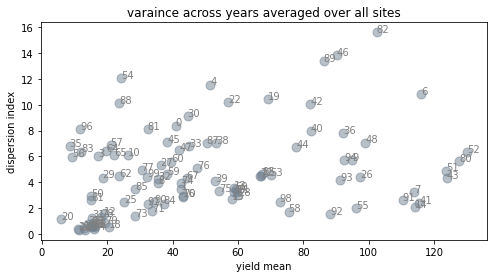

In [309]:
# yield variance across site & years
yield_mean = df_all.groupby('cvar').mean().dm_ear
yield_variance = df_all.groupby('cvar').var().dm_ear

# visulization
fig = plt.figure(figsize=(8,4))
ax = fig.add_subplot()
sc = ax.scatter(yield_mean, yield_variance/yield_mean, c='slategrey', s=80, alpha=0.5)
for i in np.arange(100):
    ax.annotate(i, (yield_mean[i], yield_variance[i]/yield_mean[i]), c='grey')
    
ax.set_xlabel('yield mean')
ax.set_ylabel('dispersion index')
ax.set_title('varaince across years averaged over all sites')
#plt.savefig('/home/disk/eos8/ach315/upscale/figs/varstd_acrossyears.png', format='png', dpi=800)

### Splint into different climate space

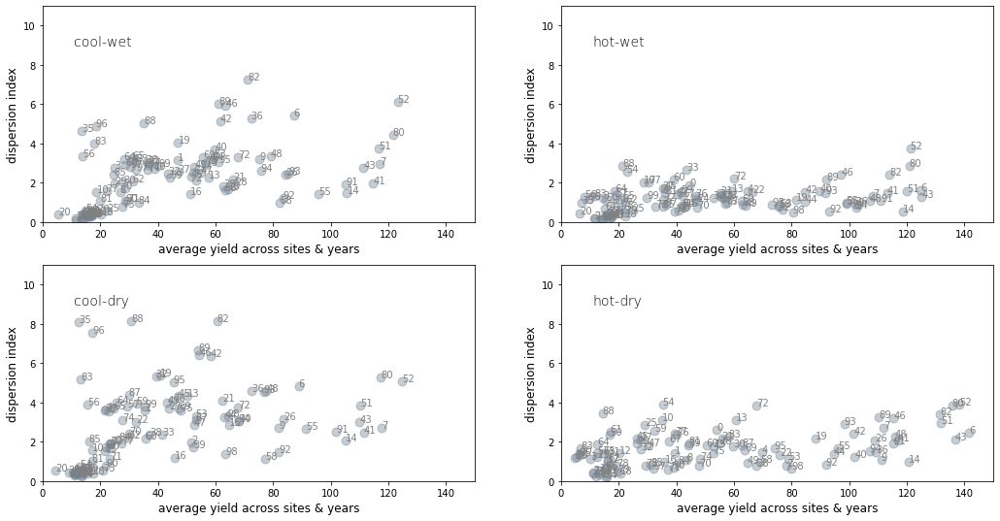

In [311]:
# set up climatology info
df_climate = pd.read_csv('/home/disk/eos8/ach315/upscale/weadata/wea_summary.csv', index_col=0)
df_climate_site = df_climate.groupby('site').mean()

# temp & vpd threshold
temp_threshold = 18
vpd_threshold = 0.7

# subsetting sites
df_hotwet = df_climate_site[(df_climate_site.temp>temp_threshold) & (df_climate_site.vpd<vpd_threshold)]
df_hotdry = df_climate_site[(df_climate_site.temp>temp_threshold) & (df_climate_site.vpd>vpd_threshold)]
df_coolwet = df_climate_site[(df_climate_site.temp<temp_threshold) & (df_climate_site.vpd<vpd_threshold)]
df_cooldry = df_climate_site[(df_climate_site.temp<temp_threshold) & (df_climate_site.vpd>vpd_threshold)]

# formatting sites
hotwet_sites = df_hotwet.index.tolist()
hotdry_sites = df_hotdry.index.tolist()
coolwet_sites = df_coolwet.index.tolist()
cooldry_sites = df_cooldry.index.tolist()
hotwet_sites = [str(site) for site in hotwet_sites]
hotdry_sites = [str(site) for site in hotdry_sites]
coolwet_sites = [str(site) for site in coolwet_sites]
cooldry_sites = [str(site) for site in cooldry_sites]

# yield mean & variance at each site
site_mean = df_all.groupby(['cvar', 'site']).mean().dm_ear
site_var = df_all.groupby(['cvar', 'site']).var().dm_ear
site_mean = site_mean.reset_index()
site_var = site_var.reset_index()

climate_space = [coolwet_sites, hotwet_sites, cooldry_sites, hotdry_sites]
text = ['cool-wet', 'hot-wet', 'cool-dry', 'hot-dry']

# visualization
fig, axs = plt.subplots(2, 2, figsize=(16,8))
for cspace, ax, txt in zip(climate_space, axs.flatten(), text):
    sitemean_cspace = site_mean[site_mean.site.isin(cspace)]
    sitevar_cspace = site_var[site_var.site.isin(cspace)]

    mean_mean = []
    var_mean = []

    for i in np.arange(100):
        # mean of yield means across years 
        mean_mean.append(sitemean_cspace[sitemean_cspace.cvar==i].dm_ear.mean())
        # mean of yield variance across years
        var_mean.append(sitevar_cspace[sitevar_cspace.cvar==i].dm_ear.mean())

    sc = ax.scatter(mean_mean, 
                    np.divide(np.array(var_mean),np.array(mean_mean)), 
                    c='slategrey', s=80, alpha=0.4)
    
    for i in np.arange(100):
        ax.annotate(i, (mean_mean[i], 
                        np.divide(np.array(var_mean),np.array(mean_mean))[i]), c='grey')

    ax.set_xlim(0,150)
    ax.set_ylim(0,11)
    ax.set_xlabel('average yield across sites & years', size=12)
    ax.set_ylabel('dispersion index', size=12)
    ax.text(10.8, 9, txt, size=14, fontweight='light')

fig.subplots_adjust(left=0.1, bottom=0.1, right=0.95, top=0.95, wspace=0.2, hspace=0.2)
#plt.savefig('/home/disk/eos8/ach315/upscale/figs/vars_acrossyears_cspace.png', format='png', dpi=800)

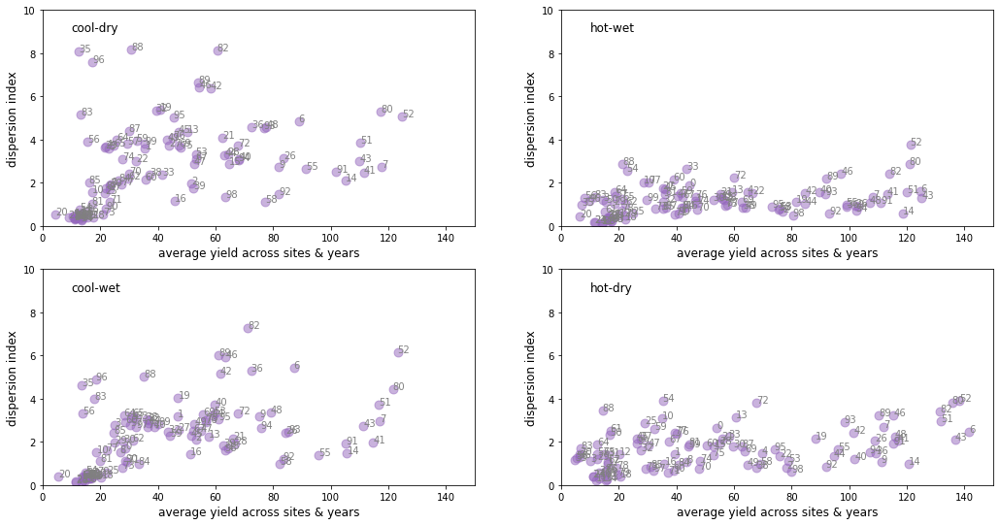

In [249]:
# set up climatology info
df_climate = pd.read_csv('/home/disk/eos8/ach315/upscale/weadata/wea_summary.csv', index_col=0)
df_climate_site = df_climate.groupby('site').mean()

# temp & vpd threshold
temp_threshold = 18
vpd_threshold = 0.7

# subsetting sites
df_hotwet = df_climate_site[(df_climate_site.temp>temp_threshold) & (df_climate_site.vpd<vpd_threshold)]
df_hotdry = df_climate_site[(df_climate_site.temp>temp_threshold) & (df_climate_site.vpd>vpd_threshold)]
df_coolwet = df_climate_site[(df_climate_site.temp<temp_threshold) & (df_climate_site.vpd<vpd_threshold)]
df_cooldry = df_climate_site[(df_climate_site.temp<temp_threshold) & (df_climate_site.vpd>vpd_threshold)]

# formatting sites
hotwet_sites = df_hotwet.index.tolist()
hotdry_sites = df_hotdry.index.tolist()
coolwet_sites = df_coolwet.index.tolist()
cooldry_sites = df_cooldry.index.tolist()
hotwet_sites = [str(site) for site in hotwet_sites]
hotdry_sites = [str(site) for site in hotdry_sites]
coolwet_sites = [str(site) for site in coolwet_sites]
cooldry_sites = [str(site) for site in cooldry_sites]

# yield mean & variance at each site
site_mean = df_all.groupby(['cvar', 'site']).mean().dm_ear
site_var = df_all.groupby(['cvar', 'site']).var().dm_ear
site_mean = site_mean.reset_index()
site_var = site_var.reset_index()

climate_space = [cooldry_sites, hotwet_sites, coolwet_sites, hotdry_sites]
text = ['cool-dry', 'hot-wet', 'cool-wet', 'hot-dry']

# visualization
fig, axs = plt.subplots(2, 2, figsize=(16,8))
for cspace, ax, txt in zip(climate_space, axs.flatten(), text):
    sitemean_cspace = site_mean[site_mean.site.isin(cspace)]
    sitevar_cspace = site_var[site_var.site.isin(cspace)]

    mean_mean = []
    var_mean = []

    for i in np.arange(100):
        # mean of yield means across years 
        mean_mean.append(sitemean_cspace[sitemean_cspace.cvar==i].dm_ear.mean())
        # mean of yield variance across years
        var_mean.append(sitevar_cspace[sitevar_cspace.cvar==i].dm_ear.mean())

    sc = ax.scatter(mean_mean, 
                    np.divide(np.array(var_mean),np.array(mean_mean)), 
                    c='tab:purple', s=80, alpha=0.5)
    
    for i in np.arange(100):
        ax.annotate(i, (mean_mean[i], 
                        np.divide(np.array(var_mean),np.array(mean_mean))[i]), c='grey')

    ax.set_xlim(0,150)
    ax.set_ylim(0,10)
    ax.set_xlabel('average yield across sites & years', size=12)
    ax.set_ylabel('dispersion index', size=12)
    ax.text(10, 9, txt, size=12)

fig.subplots_adjust(left=0.1, bottom=0.1, right=0.95, top=0.95, wspace=0.2, hspace=0.2)
#plt.savefig('/home/disk/eos8/ach315/upscale/figs/vars_acrossyears_cspace.png', format='png', dpi=800)

/home/disk/eos8/ach315/anaconda3/envs/ideotype/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:387: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  return matplotlib.axes.Axes.draw(self, renderer=renderer,


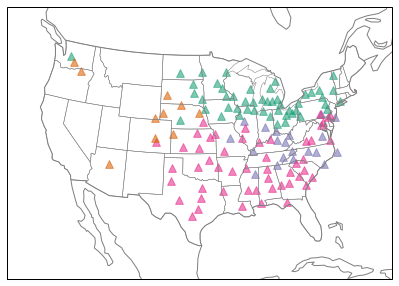

In [312]:
fig = plt.figure(figsize=(7,5))
cspaces = [hotwet_sites, hotdry_sites, coolwet_sites, cooldry_sites]
colors = ['#7570b390', '#e7298a90', '#1b9e7790', '#d95f0290']

ax = fig.add_subplot(1,1,1, projection=ccrs.AlbersEqualArea(
    central_latitude=39.5, central_longitude=-98.35))
ax.set_extent([-123, -72, 19, 53])

for cspace, color in zip(cspaces, colors):
    df_sub = df_sites[df_sites.site.isin(cspace)]

    ax.scatter(df_sub.lon, df_sub.lat,
               transform=ccrs.PlateCarree(), s=60, marker='^',
               c=color)

ax.add_feature(cfeature.BORDERS, edgecolor='grey')
ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)

#plt.savefig('/home/disk/eos8/ach315/upscale/figs/sites_weastation_cspace.png', format='png', dpi=800)

### ML Clustering methods to seperate out sites

/home/disk/eos8/ach315/anaconda3/envs/ideotype/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:387: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  return matplotlib.axes.Axes.draw(self, renderer=renderer,


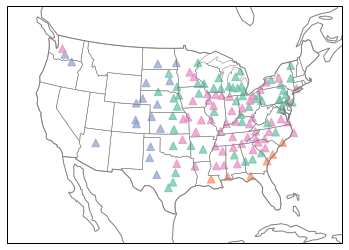

In [201]:
df_wea_sites = df_wea.groupby('site').mean()
df_wea_sites = df_wea_sites[['temp', 'rh', 'precip']]

kmeans = KMeans(n_clusters=4)
kmeans.fit(df_wea_sites)
y_kmeans = kmeans.predict(df_wea_sites)

df_wea_sites['group'] = y_kmeans
df_wea_sites = df_wea_sites.merge(df_sites, how='inner', left_on=df_wea_sites.index, right_on=df_sites.site)


colors = {0: '#66c2a5',
          1: '#fc8d62',
          2: '#8da0cb',
          3: '#e78ac3'}

fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.AlbersEqualArea(
    central_latitude=39.5, central_longitude=-98.35))
ax.set_extent([-123, -72, 19, 53])
ax.scatter(df_wea_sites.lon, df_wea_sites.lat,
           transform=ccrs.PlateCarree(), s=60, marker='^',
           c=df_wea_sites.group.map(colors), alpha=0.7)
ax.add_feature(cfeature.BORDERS, edgecolor='grey')
ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)

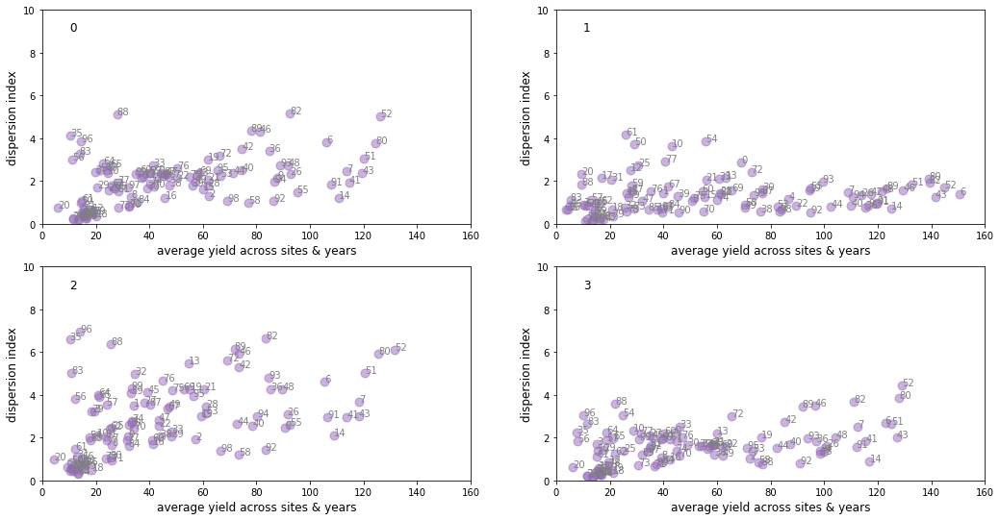

In [212]:
# yield mean & variance at each site
site_mean = df_all.groupby(['cvar', 'site']).mean().dm_ear
site_var = df_all.groupby(['cvar', 'site']).var().dm_ear
site_mean = site_mean.reset_index()
site_var = site_var.reset_index()

climate_space = [0,1,2,3]
text = ['0', '1', '2', '3']

# visualization
fig, axs = plt.subplots(2, 2, figsize=(16,8))
for cspace, ax, txt in zip(climate_space, axs.flatten(), text):
    site = df_wea_sites[df_wea_sites.group == cspace].key_0    
    sitemean_cspace = site_mean[site_mean.site.isin(site)]
    sitevar_cspace = site_var[site_var.site.isin(site)]

    mean_mean = []
    var_mean = []

    for i in np.arange(100):
        # mean of yield means across years 
        mean_mean.append(sitemean_cspace[sitemean_cspace.cvar==i].dm_ear.mean())
        # mean of yield variance across years
        var_mean.append(sitevar_cspace[sitevar_cspace.cvar==i].dm_ear.mean())

    sc = ax.scatter(mean_mean, 
                    np.divide(np.array(var_mean),np.array(mean_mean)), 
                    c='tab:purple', s=80, alpha=0.5)
    
    for i in np.arange(100):
        ax.annotate(i, (mean_mean[i], 
                        np.divide(np.array(var_mean),np.array(mean_mean))[i]), c='grey')

    ax.set_xlim(0,160)
    ax.set_ylim(0,10)
    ax.set_xlabel('average yield across sites & years', size=12)
    ax.set_ylabel('dispersion index', size=12)
    ax.text(10, 9, txt, size=12)

fig.subplots_adjust(left=0.1, bottom=0.1, right=0.95, top=0.95, wspace=0.2, hspace=0.2)
#plt.savefig('/home/disk/eos8/ach315/upscale/figs/vars_acrossyears_cspace.png', format='png', dpi=800)

/home/disk/eos8/ach315/anaconda3/envs/ideotype/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:387: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  return matplotlib.axes.Axes.draw(self, renderer=renderer,


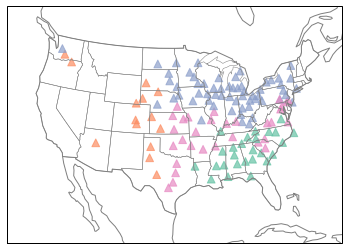

In [234]:
df_wea_sites = df_wea.groupby('site').mean()
df_wea_sites = df_wea_sites[['temp', 'rh']]

kmeans = KMeans(n_clusters=4)
kmeans.fit(df_wea_sites)
y_kmeans = kmeans.predict(df_wea_sites)

df_wea_sites['group'] = y_kmeans
df_wea_sites = df_wea_sites.merge(df_sites, how='inner', left_on=df_wea_sites.index, right_on=df_sites.site)

colors = {0: '#66c2a5', # green
          1: '#fc8d62', # orange
          2: '#8da0cb', # blue
          3: '#e78ac3'} # pink


fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.AlbersEqualArea(
    central_latitude=39.5, central_longitude=-98.35))
ax.set_extent([-123, -72, 19, 53])
ax.scatter(df_wea_sites.lon, df_wea_sites.lat,
           transform=ccrs.PlateCarree(), s=60, marker='^',
           c=df_wea_sites.group.map(colors), alpha=0.7)
ax.add_feature(cfeature.BORDERS, edgecolor='grey')
ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)

/home/disk/eos8/ach315/anaconda3/envs/ideotype/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:387: MatplotlibDeprecationWarning: 
The 'inframe' parameter of draw() was deprecated in Matplotlib 3.3 and will be removed two minor releases later. Use Axes.redraw_in_frame() instead. If any parameter follows 'inframe', they should be passed as keyword, not positionally.
  return matplotlib.axes.Axes.draw(self, renderer=renderer,


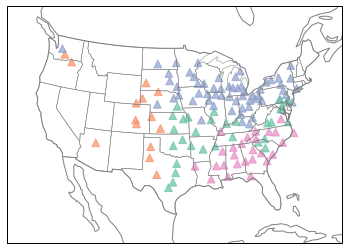

In [214]:
df_wea_sites = df_wea.groupby('site').mean()
df_wea_sites = df_wea_sites[['temp', 'rh']]

kmeans = KMeans(n_clusters=4)
kmeans.fit(df_wea_sites)
y_kmeans = kmeans.predict(df_wea_sites)

df_wea_sites['group'] = y_kmeans
df_wea_sites = df_wea_sites.merge(df_sites, how='inner', left_on=df_wea_sites.index, right_on=df_sites.site)

colors = {0: '#66c2a5', # green
          1: '#fc8d62', # orange
          2: '#8da0cb', # blue
          3: '#e78ac3'} # pink


fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot(1,1,1, projection=ccrs.AlbersEqualArea(
    central_latitude=39.5, central_longitude=-98.35))
ax.set_extent([-123, -72, 19, 53])
ax.scatter(df_wea_sites.lon, df_wea_sites.lat,
           transform=ccrs.PlateCarree(), s=60, marker='^',
           c=df_wea_sites.group.map(colors), alpha=0.7)
ax.add_feature(cfeature.BORDERS, edgecolor='grey')
ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)

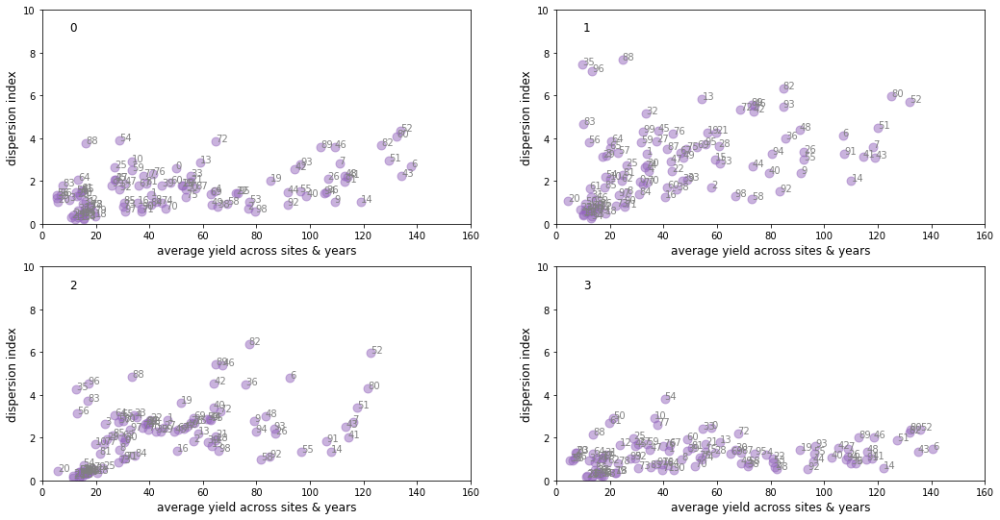

In [215]:
# yield mean & variance at each site
site_mean = df_all.groupby(['cvar', 'site']).mean().dm_ear
site_var = df_all.groupby(['cvar', 'site']).var().dm_ear
site_mean = site_mean.reset_index()
site_var = site_var.reset_index()

climate_space = [0,1,2,3]
text = ['0', '1', '2', '3']

# visualization
fig, axs = plt.subplots(2, 2, figsize=(16,8))
for cspace, ax, txt in zip(climate_space, axs.flatten(), text):
    site = df_wea_sites[df_wea_sites.group == cspace].key_0    
    sitemean_cspace = site_mean[site_mean.site.isin(site)]
    sitevar_cspace = site_var[site_var.site.isin(site)]

    mean_mean = []
    var_mean = []

    for i in np.arange(100):
        # mean of yield means across years 
        mean_mean.append(sitemean_cspace[sitemean_cspace.cvar==i].dm_ear.mean())
        # mean of yield variance across years
        var_mean.append(sitevar_cspace[sitevar_cspace.cvar==i].dm_ear.mean())

    sc = ax.scatter(mean_mean, 
                    np.divide(np.array(var_mean),np.array(mean_mean)), 
                    c='tab:purple', s=80, alpha=0.5)
    
    for i in np.arange(100):
        ax.annotate(i, (mean_mean[i], 
                        np.divide(np.array(var_mean),np.array(mean_mean))[i]), c='grey')

    ax.set_xlim(0,160)
    ax.set_ylim(0,10)
    ax.set_xlabel('average yield across sites & years', size=12)
    ax.set_ylabel('dispersion index', size=12)
    ax.text(10, 9, txt, size=12)

fig.subplots_adjust(left=0.1, bottom=0.1, right=0.95, top=0.95, wspace=0.2, hspace=0.2)
#plt.savefig('/home/disk/eos8/ach315/upscale/figs/vars_acrossyears_cspace.png', format='png', dpi=800)

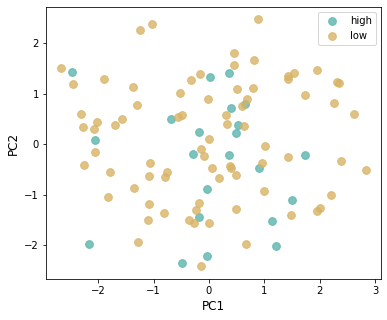

In [8]:
# setup data
df_lowyield = test[(test.mean_mean < 80)]
lowyield = df_lowyield.index.tolist()
df_highyield = test[(test.mean_mean > 80)]
highyield = df_highyield.index.tolist()
df_params_sub = df_params.loc[lowyield + highyield,:]
df_params_sub.loc[lowyield, 'yield'] = 'low'
df_params_sub.loc[highyield, 'yield'] = 'high'
df_params_sub = df_params_sub.reset_index()

# pca
features = ['juv_leaves', 'stayGreen', 'rmax_ltir', 'phyllo', 'LM_min',
            'Vcmax', 'Vpmax', 'g1', 'ref_potential']
target = 'yield'
x = df_params_sub[features]
x = StandardScaler().fit_transform(x)

y = df_params_sub[target].values

pca = PCA(n_components=5)
principalComponents = pca.fit_transform(x)
principalDF = pd.DataFrame(data = principalComponents,
                           columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])
finalDF = pd.concat([principalDF, df_params_sub.loc[:,target]], axis = 1)

# plots
fig = plt.figure(figsize=(6,5))
ax = fig.add_subplot() 

groups = ['high', 'low']
colors = ['#5ab4ac', '#d8b365']

for group, color in zip(groups, colors):
    index = finalDF['yield'] == group
    ax.scatter(finalDF.loc[index, 'PC1'], finalDF.loc[index, 'PC2'],
               c=color, s=60, alpha=0.8)
ax.set_xlabel('PC1', fontsize = 12)
ax.set_ylabel('PC2', fontsize = 12)
ax.legend(groups)

In [252]:
print(pca.explained_variance_ratio_)

[0.19464533 0.14838891 0.13355437 0.10865142 0.09774583]


In [9]:
ear_mean = df_all.groupby('cvar').mean().dm_ear
ear_var = df_all.groupby('cvar').var().dm_ear

In [10]:
df_params['ear_mean'] = ear_mean
df_params['ear_var'] = ear_var

variance explained:  [0.3170844  0.19265117 0.16466224 0.09540961 0.07214415]


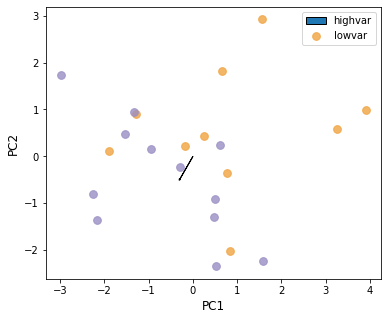

In [28]:
df_lowvar = test[(test.mean_mean > 80) & (test.var_mean < 250)]
lowvar = df_lowvar.index.tolist()
df_highvar = test[(test.mean_mean > 80) & (test.var_mean > 250)]
highvar = df_highvar.index.tolist()

df_params_sub = df_params.loc[lowvar + highvar,:]
df_params_sub.loc[lowvar, 'var'] = 'lowvar'
df_params_sub.loc[highvar, 'var'] = 'highvar'
df_params_sub = df_params_sub.reset_index()

features = ['juv_leaves', 'stayGreen', 'rmax_ltir', 'phyllo', 'LM_min',
            'Vcmax', 'Vpmax', 'g1', 'ref_potential']
target = 'var'
x = df_params_sub[features]
x = StandardScaler().fit_transform(x)
y = df_params_sub[target].values

pca = PCA(n_components=5)
principalComponents = pca.fit_transform(x)
principalDF = pd.DataFrame(data = principalComponents,
                           columns = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5'])
finalDF = pd.concat([principalDF, df_params_sub.loc[:,target]], axis = 1)
print('variance explained: ', pca.explained_variance_ratio_)


groups = ['highvar', 'lowvar']
colors = ['#f1a340', '#998ec3']

fig = plt.figure(figsize = (6,5))
ax = fig.add_subplot() 

for group, color in zip(groups, colors):
    index = finalDF['var'] == group
    ax.scatter(finalDF.loc[index, 'PC1'], finalDF.loc[index, 'PC2'],
               c=color, s=60, alpha=0.8)
ax.set_xlabel('PC1', fontsize = 12)
ax.set_ylabel('PC2', fontsize = 12)
#for i in range(len(pca.components_[0])):
#    ax.arrow(0,0, dx=pca.components_[0,i], dy=pca.components_[1,i],
#             head_width=0.03, head_length=0.03, length_includes_head=True)
i = 8
ax.arrow(0,0, dx=pca.components_[0,i], dy=pca.components_[1,i],
         head_width=0.03, head_length=0.03, length_includes_head=True)
ax.legend(groups)

In [29]:
pca.components_[0]

array([[ 0.50953459,  0.43741411,  0.46433428,  0.30349182, -0.04945805,
         0.10137719,  0.34042312,  0.12382423, -0.31206732],
       [ 0.00210097, -0.15775074, -0.17051912, -0.4550083 ,  0.54236854,
         0.02034922,  0.42536992,  0.04515862, -0.51131631],
       [ 0.12140802,  0.03706028, -0.08733031,  0.18938172,  0.38670639,
        -0.48302423, -0.23761935,  0.70007023,  0.10478117],
       [ 0.14145748, -0.24332448,  0.18061342, -0.09712463, -0.27940957,
        -0.81490189,  0.09810514, -0.31158711, -0.17286591],
       [ 0.31565882, -0.58729858, -0.26486856,  0.31033652, -0.27087416,
         0.23244951, -0.20419564,  0.16570893, -0.43865121]])

### Testing out contour plots

In [137]:
ears = df_all.groupby('cvar').mean().dm_ear
leafarea = df_all.groupby('cvar').mean().LA
lai = df_all.groupby('cvar').mean().LAI

df_params['ear'] = pd.cut(ears, bins=np.arange(0,150,30))
df_params['leafarea'] = pd.cut(leafarea, bins=np.arange(150,800,100))
df_params['lai'] = pd.cut(lai, bins=np.arange(0.1,0.6,0.1))

df_params_analyze = df_params.drop(columns=['cvar', 'leafarea', 'lai'])

Text(0, 0.5, 'rmax_ltir')

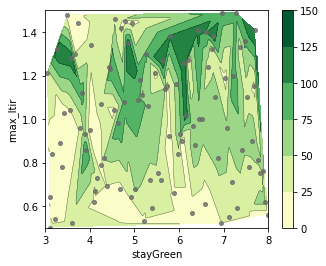

In [130]:
# setup x y z values
x = df_params.stayGreen
y = df_params.rmax_ltir
z = ears

xi = np.linspace(3,8,200)
yi = np.linspace(0.5, 1.5, 200)
triang = tri.Triangulation(x, y)

interpolator = tri.LinearTriInterpolator(triang, z)
Xi, Yi = np.meshgrid(xi, yi)
zi = interpolator(Xi, Yi)

# visualize
fig, ax = plt.subplots(figsize=(5,4))
ax.contour(xi, yi, zi, levels=5, linewidths=0.5, colors='k', alpha=0.5)
#cntr1 = ax.contourf(xi, yi, zi, levels=5, cmap="RdBu_r")
cntr1 = ax.contourf(xi, yi, zi, levels=5, cmap="YlGn")

fig.colorbar(cntr1, ax=ax)
ax.plot(x, y, 'ko', color='dimgrey', alpha=0.8, ms=4)
ax.set(xlim=(3,8), ylim=(0.5, 1.5))
ax.set_xlabel('stayGreen')
ax.set_ylabel('rmax_ltir')
#ax.set_title('grid and contour (%d points, %d grid points)' %
#              (npts, ngridx * ngridy))

In [131]:
site_var = df_all.groupby(['cvar', 'site']).var().dm_ear
ear_var = []
for var in np.arange(100):
    ear_var.append(site_var[(var,)].var())

Text(0, 0.5, 'rmax_ltir')

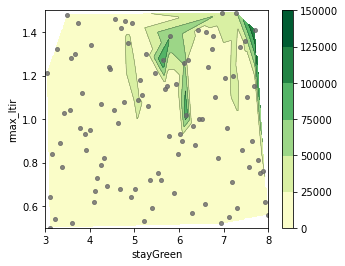

In [132]:
# setup x y z values
x = df_params.stayGreen
y = df_params.rmax_ltir
z = ear_var

xi = np.linspace(3,8,200)
yi = np.linspace(0.5, 1.5, 200)
triang = tri.Triangulation(x, y)

interpolator = tri.LinearTriInterpolator(triang, z)
Xi, Yi = np.meshgrid(xi, yi)
zi = interpolator(Xi, Yi)

# visualize
fig, ax = plt.subplots(figsize=(5,4))
ax.contour(xi, yi, zi, levels=5, linewidths=0.5, colors='k', alpha=0.5)
#cntr1 = ax.contourf(xi, yi, zi, levels=5, cmap="RdBu_r")
cntr1 = ax.contourf(xi, yi, zi, levels=5, cmap="YlGn")

fig.colorbar(cntr1, ax=ax)
ax.plot(x, y, 'ko', color='dimgrey', alpha=0.8, ms=4)
ax.set(xlim=(3,8), ylim=(0.5, 1.5))
ax.set_xlabel('stayGreen')
ax.set_ylabel('rmax_ltir')
#ax.set_title('grid and contour (%d points, %d grid points)' %
#              (npts, ngridx * ngridy))

### Plotting out all pair-wise parameter combinations

In [133]:
df_params = pd.read_csv('/home/disk/eos8/ach315/upscale/params/param_opt.csv')
df_params = df_params.drop(['rmax_ltar'], axis=1)
df_params.head()

,juv_leaves,stayGreen,rmax_ltir,phyllo,LM_min,Vcmax,Vpmax,g1,ref_potential
0,23,4.44,1.24,3.31,98.77,77.29,92.57,9.86,-3.38
1,16,7.13,0.55,3.98,89.85,67.10,87.81,1.37,-2.83
2,21,6.51,1.00,3.04,81.24,66.65,81.56,3.88,-2.63
3,24,4.67,0.68,3.24,97.70,69.56,69.67,4.86,-3.63
4,20,4.32,0.82,3.13,115.08,64.44,101.27,6.31,-3.40


In [134]:
num_params = df_params.shape[1]
params = df_params.columns

plotting_order = []
for p1 in np.arange(num_params):
    for p2 in np.arange(num_params):
        plotting_order.append((params[p2], params[p1])) # switch to match x-y label

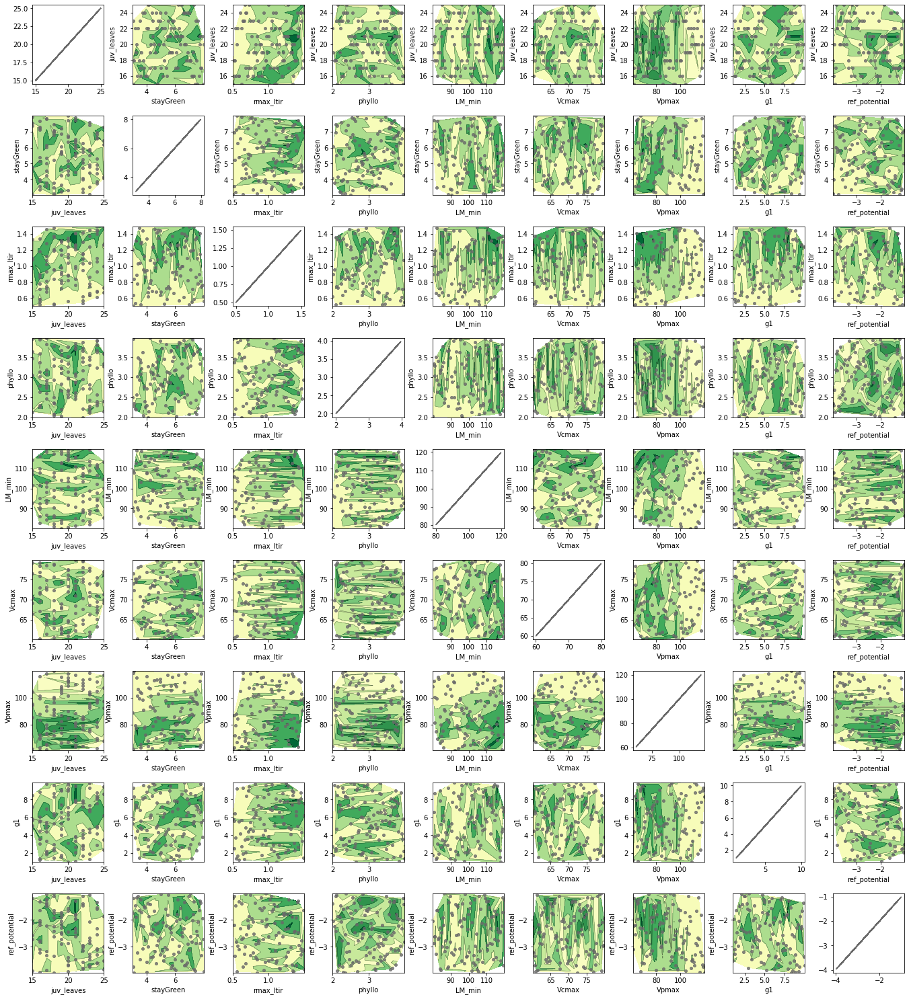

In [136]:
num_params = df_params.shape[1]

fig, axs = plt.subplots(9, 9, figsize=(20,20))

for ax, param in zip(axs.flatten(), plotting_order):
    param_x = param[0]
    param_y = param[1]
    x = df_params[param_x]
    y = df_params[param_y]
    z = ears
    
    if param_x == param_y:
        ax.plot(x, y, color='dimgrey')
        
    else:
        xi = np.linspace(x.min(), x.max(), 200)
        yi = np.linspace(y.min(), y.max(), 200)
        triang = tri.Triangulation(x, y)

        interpolator = tri.LinearTriInterpolator(triang, z)
        Xi, Yi = np.meshgrid(xi, yi)
        zi = interpolator(Xi, Yi)   
        
        ax.contour(xi, yi, zi, levels=3, linewidths=0.5, colors='k', alpha=0.5)
        cntr = ax.contourf(xi, yi, zi, levels=3, cmap="YlGn")

#        fig.colorbar(cntr, ax=ax)
        ax.plot(x, y, 'ko', color='dimgrey', alpha=0.8, ms=4)
        ax.set(xlim=(x.min(), x.max()), ylim=(y.min(), y.max()))
        ax.set_xlabel(param_x)
        ax.set_ylabel(param_y)

fig.subplots_adjust(left=0.05, bottom=0, right=0.95, top=1, wspace=0.4, hspace=0.4)

#plt.savefig('/home/disk/eos8/ach315/upscale/figs/contourplot.png', format='png', dpi=800)

### 2. Trait covariance matrix
Parameter space & correlation <br/>
All parameters are assumed to have a linear distribution and sampling was random through LHC, so in theory shouldn't display any clear patterns.

In [272]:
num_params = df_params.shape[1]
params = df_params.columns

plotting_order = []
for p1 in np.arange(num_params):
    for p2 in np.arange(num_params):
        plotting_order.append((params[p2], params[p1])) # switch to match x-y label

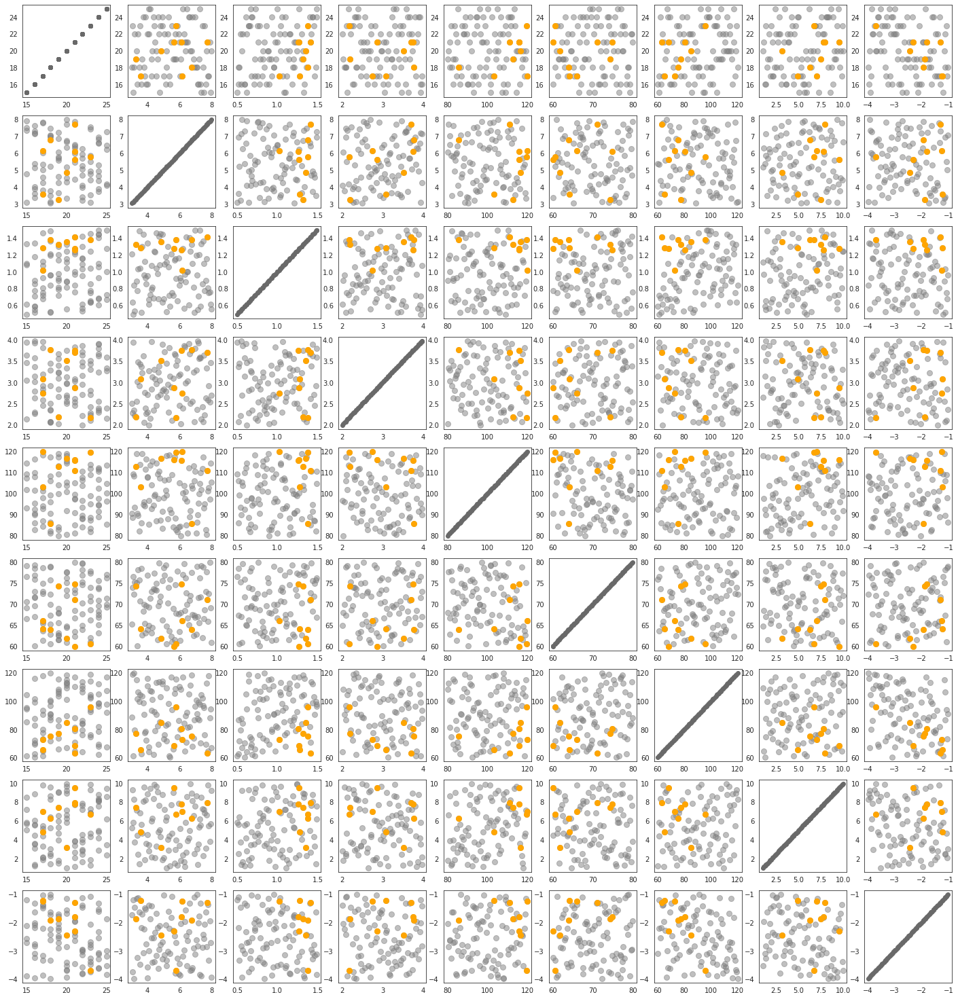

In [490]:
num_params = df_params.shape[1]
params = df_params.columns

plotting_order = []
for p1 in np.arange(num_params):
    for p2 in np.arange(num_params):
        plotting_order.append((params[p2], params[p1])) # switch to match x-y label

fig, axs = plt.subplots(9, 9, figsize=(20,20))

for ax, param in zip(axs.flatten(), plotting_order):
    param_x = param[0]
    param_y = param[1]
    x = df_params[param_x]
    y = df_params[param_y]
    x_hyield = df_params[param_x][[6,7,14,41,43,51,52,80,82]]
    y_hyield = df_params[param_y][[6,7,14,41,43,51,52,80,82]]

    
    if param_x == param_y:
        ax.scatter(x, y, color='dimgrey')
        
    else:
        ax.plot(x, y, 'ko', color='grey', alpha=0.5, ms=8)
        ax.plot(x_hyield, y_hyield, 'ko', color='orange', ms=8)
#        ax.set_xlabel(param_x)
#        ax.set_ylabel(param_y)

fig.subplots_adjust(left=0, bottom=0, right=0.95, top=1, wspace=0.2, hspace=0.2)

#plt.savefig('/home/disk/eos8/ach315/upscale/figs/param_pairplot_scatter_hyield.png',format='png', dpi=800)

In [471]:
df_params = pd.read_csv('/home/disk/eos8/ach315/upscale/params/param_opt.csv')
df_params = df_params.drop(columns='rmax_ltar')

In [484]:
df_sub

,g1,ref_potential,dm_ear,p1_bin,p2_bin
0,9.86,-3.38,40.902991,9,1
1,1.37,-2.83,42.551432,0,3
2,3.88,-2.63,67.160429,3,4
3,4.86,-3.63,17.100455,4,1
4,6.31,-3.40,51.501795,5,1
...,...,...,...,...,...
95,8.61,-3.52,67.410628,8,1
96,1.70,-2.98,11.622124,0,3
97,5.46,-3.33,32.401922,4,2
98,5.22,-3.87,72.800646,4,0


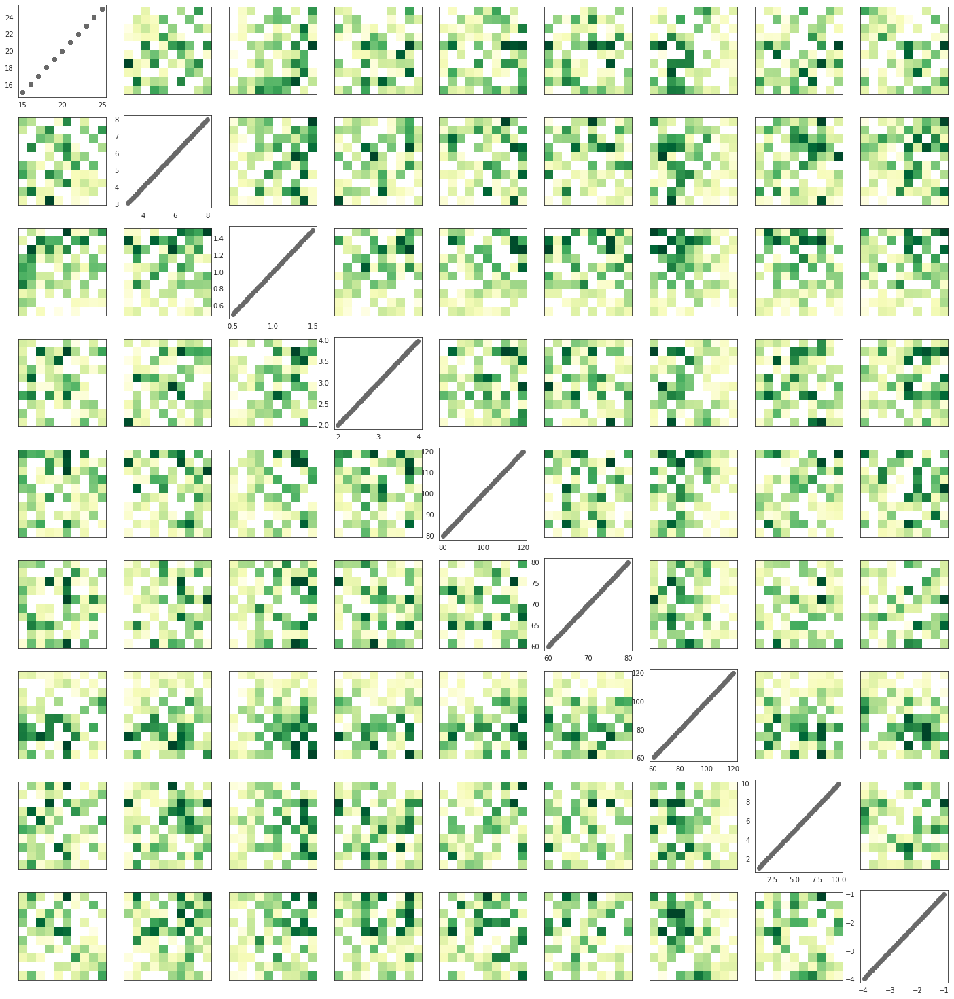

In [489]:
num_params = df_params.shape[1]
params = df_params.columns

plotting_order = []
for p1 in np.arange(num_params):
    for p2 in np.arange(num_params):
        plotting_order.append((params[p2], params[p1])) # switch to match x-y label

fig, axs = plt.subplots(9, 9, figsize=(20,20))

for ax, param in zip(axs.flatten(), plotting_order):
    px = param[0]
    py = param[1]
    x = df_params[px]
    y = df_params[py]

    if px == py:
        ax.scatter(x, y, color='dimgrey')
        
    else:
        df_sub = pd.DataFrame([x, y, ears])
        df_sub = df_sub.transpose()
        px_bin = pd.cut(df_sub.loc[:,px], 10, labels=False)
        py_bin = pd.cut(df_sub.loc[:,py], 10, labels=False)
        df_sub['px_bin'] = px_bin
        df_sub['py_bin'] = py_bin
        
        ear_list = []
        for py_cat in reversed(range(len(set(py_bin)))):
            sub_list = []
            for px_cat in range(len(set(px_bin))):
                meanear = df_sub[(df_sub['px_bin']==px_cat) & (df_sub['py_bin']==py_cat)].dm_ear.mean()
                sub_list.append(meanear)
            ear_list.append(sub_list)
        ax.imshow(ear_list, cmap=YlGn_9.mpl_colormap)
        ax.axes.xaxis.set_visible(False)
        ax.axes.yaxis.set_visible(False)

fig.subplots_adjust(left=0, bottom=0, right=0.95, top=1, wspace=0.2, hspace=0.2)
#plt.savefig('/home/disk/eos8/ach315/upscale/figs/param_pairplot_heatmap.png', format='png', dpi=800)

In [ ]:
param = ('Vpmax', 'rmax_ltir')
param_x = param[0]
param_y = param[1]
x = df_params[param_x]
y = df_params[param_y]

df_sub = pd.DataFrame([x, y, ears])
df_sub = df_sub.transpose()
p1 = param[0]
p2 = param[1]
p1_bin = pd.cut(df_sub.loc[:,p1], 10, labels=False)
p2_bin = pd.cut(df_sub.loc[:,p2], 10, labels=False)
df_sub['p1_bin'] = p1_bin
df_sub['p2_bin'] = p2_bin

ear_list = []

for p2_cat in range(len(set(p1_bin))):
    sub_list = []
    for p1_cat in range(len(set(p2_bin))):
        meanear = df_sub[(df_sub['p1_bin']==p1_cat) & (df_sub['p2_bin']==p2_cat)].dm_ear.mean()
        sub_list.append(meanear)

    ear_list.append(sub_list)
    
plt.imshow(ear_list, cmap=YlGnBu_8.mpl_colormap)

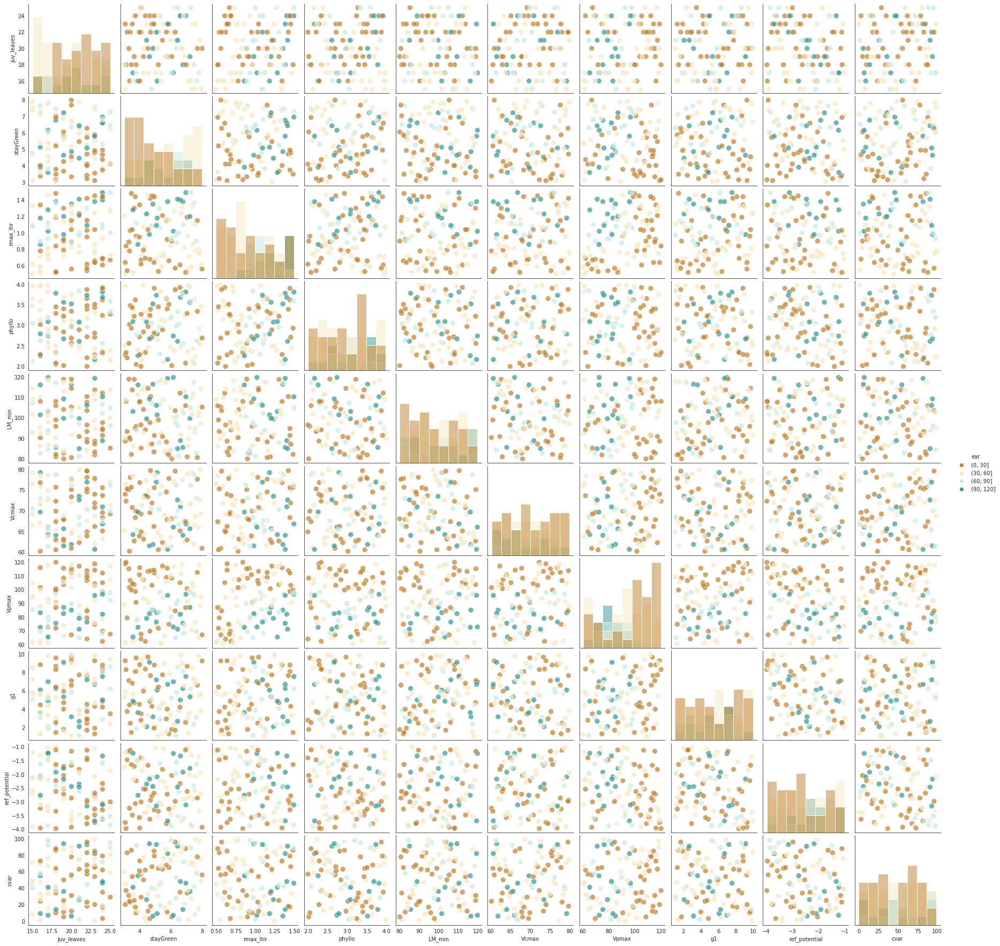

In [5]:
ears = df_all.groupby('cvar').mean().dm_ear
leafarea = df_all.groupby('cvar').mean().LA
lai = df_all.groupby('cvar').mean().LAI

df_params['ear'] = pd.cut(ears, bins=np.arange(0,150,30))
df_params['leafarea'] = pd.cut(leafarea, bins=np.arange(150,800,100))
df_params['lai'] = pd.cut(lai, bins=np.arange(0.1,0.6,0.1))

df_params_analyze = df_params.drop(columns=['leafarea', 'lai'])
#df_params_analyze = df_params.drop(columns=['cvar', 'leafarea', 'lai'])
sns.set_style('white')
sns_plot = sns.pairplot(df_params_analyze, hue='ear', palette='BrBG', diag_kind='hist', 
                        plot_kws=dict(alpha=0.7, s=100))
#sns_plot.savefig('/home/disk/eos8/ach315/upscale/figs/param_yield_diverge.png')

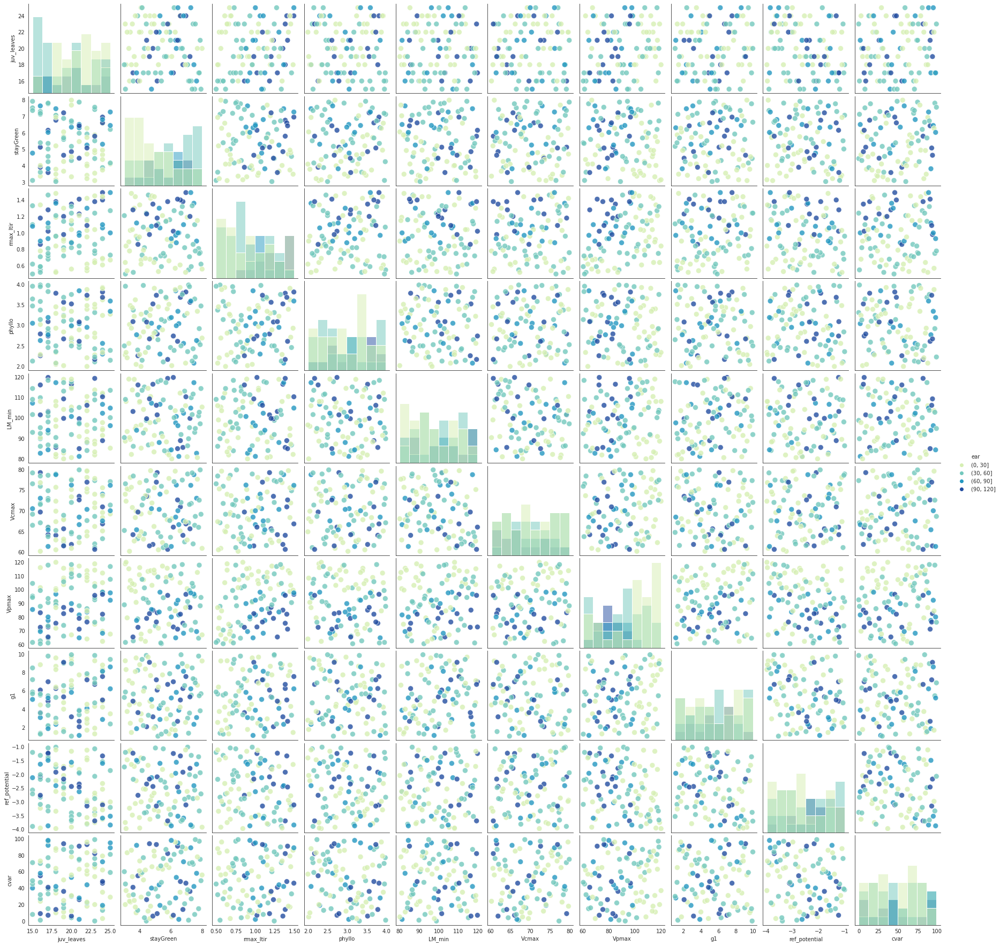

In [6]:
df_params_analyze = df_params.drop(columns=['leafarea', 'lai'])
sns.set_style('white')
sns_plot = sns.pairplot(df_params_analyze, hue='ear', palette='YlGnBu', diag_kind='hist', plot_kws=dict(alpha=0.8, s=100))
#sns_plot.savefig('/home/disk/eos8/ach315/upscale/figs/param_yield.png')

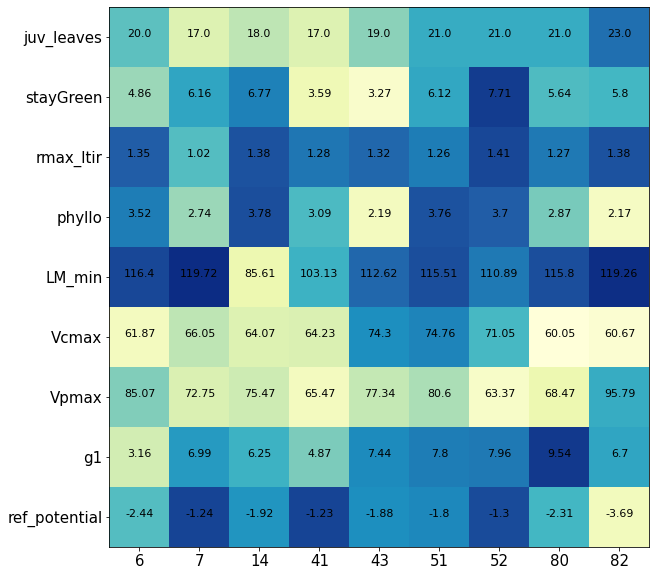

In [268]:
# TODO: look into sns.heatmap with the annot=True argument
df_params = pd.read_csv('/home/disk/eos8/ach315/upscale/params/param_opt.csv')
df_params = df_params.drop(['rmax_ltar'], axis=1)

param_range = {'juv_leaves': [15, 25],
               'stayGreen': [3,8],
               'rmax_ltir': [0.5, 1.5],
               'phyllo': [2, 4],
               'LM_min': [80, 120],
               'Vcmax': [60, 80],
               'Vpmax': [60, 120],
               'g1': [1, 10], 
               'ref_potential': [-4, -1]}

params = df_params.columns
df_params_fold = pd.DataFrame(columns=params)
for i in params: 
    df_params_fold[i] = fold(df_params[i], param_range[i][0], param_range[i][1])
df_params_trans = pd.DataFrame(df_params_fold.transpose())
df_params_hyield = df_params_trans.loc[:,[6,7,14,41,43,51,52,80,82]].round(2)

cultivars = list(df_params_hyield.columns)
parameters = list(df_params_hyield.index)

fig, ax = plt.subplots(figsize=(10,10))
im = ax.imshow(df_params_hyield, cmap=YlGnBu_8.mpl_colormap)
ax.set_xticks(np.arange(df_params_hyield.shape[1]))
ax.set_yticks(np.arange(df_params_hyield.shape[0]))
ax.set_xticklabels(list(df_params_hyield.columns), size=15)
ax.set_yticklabels(list(df_params_hyield.index), size=15)

for cvar in range(len(cultivars)):
    for param in range(len(parameters)):
        text = ax.text(cvar, param, 
                       df_params.transpose().loc[parameters[param], cultivars[cvar]],
                       ha='center', color='black', size=11)
fig.subplots_adjust(left=0.15)
#plt.savefig('/home/disk/eos8/ach315/upscale/figs/params_hyield.png', format='png', dpi=800)

### Variance decomposition with a linear model
example from Koven et al, 2020: 
https://nbviewer.jupyter.org/github/NGEET/testbeds/blob/master/BCI_testbed/fates_output_analysis.ipynb

#### Goodness of fit for linear model
- R2 = 1 - SSE/SST 
    - SSE: sum of squares due to error
    - SST: total sum of squares

In [152]:
import warnings
warnings.filterwarnings('ignore')

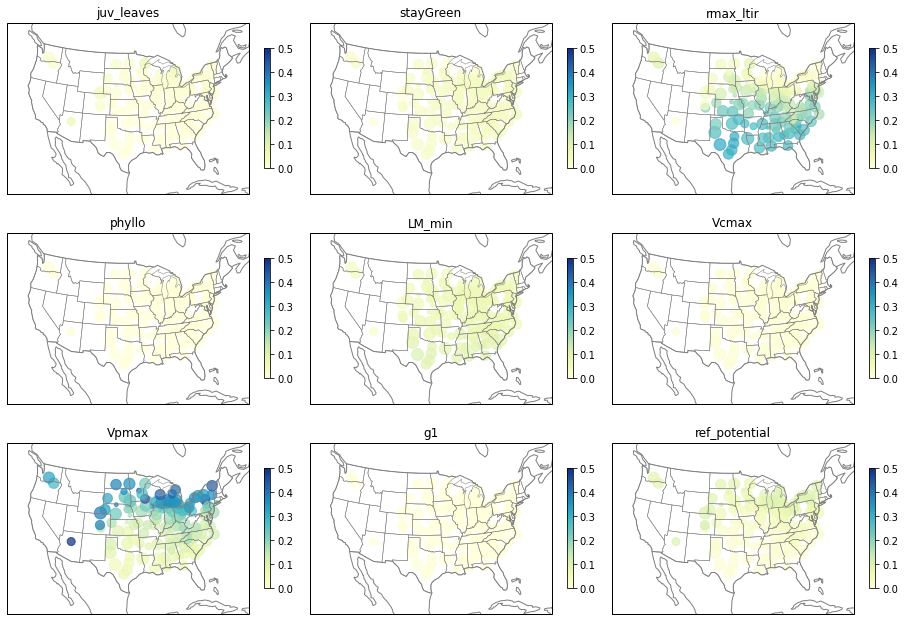

In [160]:
params = df_params.columns
sites = df_sites.site[:-1] # 201123: not sure why there's no simulation output for the last site
                           # going to exclude it for the moment

fig = plt.figure(figsize=(14,10))
    
for count, param in enumerate(params[:9]):
    variances = []
    for site in sites:
        df_s = df_all[df_all.site == site]
        df_s.reset_index(inplace=True, drop=True)
        x = df_s[param]
        y = df_s.dm_ear
        model = LinearRegression(fit_intercept=True)
        model.fit(x[:,np.newaxis],y)
        yhat = model.predict(x[:, np.newaxis])        
        var = yhat.var()/y.var() # equation Charlie used in his paper
        variances.append(var)

    ax = fig.add_subplot(3,3,count+1, projection=ccrs.AlbersEqualArea(
                         central_latitude=39.5, central_longitude=-98.35))
    ax.set_extent([-123, -72, 19, 53])
    mp = ax.scatter(df_sites.lon[:-1], df_sites.lat[:-1], s=df_sites.years[:-1]*5, 
                    c=variances, 
                    vmin=0, vmax=0.5, 
                    alpha=0.7, 
                    cmap=YlGnBu_8.mpl_colormap,
                    transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.BORDERS, edgecolor='grey')
    ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
    ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)
    ax.set_title(str(param))
    cbar=fig.colorbar(mp, shrink=0.4)
fig.subplots_adjust(left=0.05, bottom=0, right=0.95, top=1, wspace=0, hspace=-0.3)

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

params = df_params.columns
sites = df_sites.site[:-1] 

fig = plt.figure(figsize=(14,10))
    
for count, param in enumerate(params[:9]):
    variances = []
    for site in sites:
        df_s = df_all[df_all.site == site]
        df_s.reset_index(inplace=True, drop=True)
        x = df_s[param]
        y = df_s.dm_ear
        model = LinearRegression(fit_intercept=True)
        model.fit(x[:,np.newaxis],y)
        yhat = model.predict(x[:, np.newaxis])        
        var = r2_score(y, yhat) # equation Charlie used in his paper
        variances.append(var)

    ax = fig.add_subplot(3,3,count+1, projection=ccrs.AlbersEqualArea(
                         central_latitude=39.5, central_longitude=-98.35))
    ax.set_extent([-123, -72, 19, 53])
    mp = ax.scatter(df_sites.lon[:-1], df_sites.lat[:-1], s=df_sites.years[:-1]*5, 
                    c=variances, 
                    alpha=0.7, 
                    cmap=YlGnBu_8.mpl_colormap,
                    vmin=0, vmax=0.5, 
                    transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.BORDERS, edgecolor='grey')
    ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
    ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)
    ax.set_title(str(param))
    cbar=fig.colorbar(mp, shrink=0.4)
fig.subplots_adjust(left=0.05, bottom=0, right=0.95, top=1, wspace=0, hspace=-0.3)

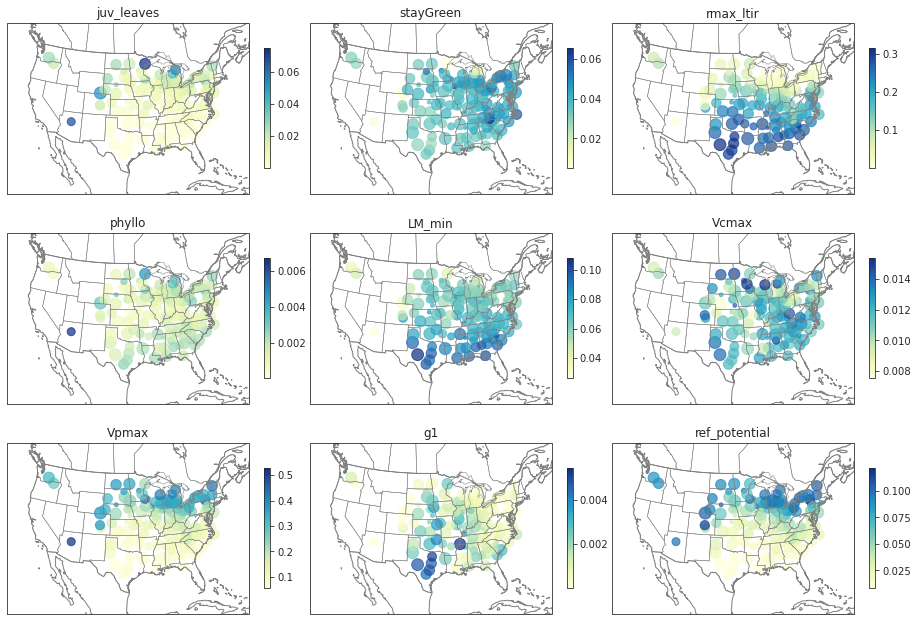

In [132]:
params = df_params.columns
sites = df_sites.site[:-1] # 201123: not sure why there's no simulation output for the last site
                           # going to exclude it for the moment

fig = plt.figure(figsize=(14,10))
    
for count, param in enumerate(params[:-1]):
    variances = []
    for site in sites:
        df_s = df_all[df_all.site == site]
        df_s.reset_index(inplace=True, drop=True)
        x = df_s[param]
        y = df_s.dm_ear
        model = LinearRegression(fit_intercept=True)
        model.fit(x[:,np.newaxis],y)
        yhat = model.predict(x[:, np.newaxis])        
        var = yhat.var()/y.var() # equation Charlie used in his paper
        variances.append(var)

    ax = fig.add_subplot(3,3,count+1, projection=ccrs.AlbersEqualArea(
                         central_latitude=39.5, central_longitude=-98.35))
    ax.set_extent([-123, -72, 19, 53])
    mp = ax.scatter(df_sites.lon[:-1], df_sites.lat[:-1], s=df_sites.years[:-1]*5, 
                    c=variances, 
                    #vmin=0.3, vmax=1, 
                    alpha=0.7, 
                    cmap=YlGnBu_8.mpl_colormap,
                    transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.BORDERS, edgecolor='grey')
    ax.add_feature(cfeature.COASTLINE, edgecolor='grey')
    ax.add_feature(cfeature.STATES, edgecolor='grey', linewidth=0.5)
    ax.set_title(str(param))
    cbar=fig.colorbar(mp, shrink=0.4)
fig.subplots_adjust(left=0.05, bottom=0, right=0.95, top=1, wspace=0, hspace=-0.3)

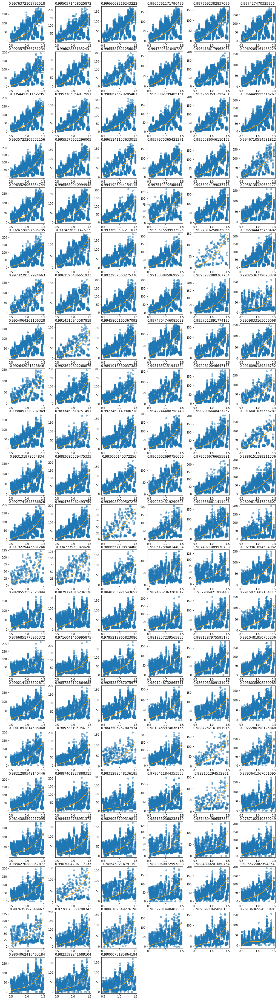

In [52]:
fig = plt.figure(figsize=(15,50))

for i, site in enumerate(sites):
    df_s = df_all[df_all.site == site]
    df_s.reset_index(inplace=True, drop=True)
    x = df_s.rmax_ltir
    y = df_s.dm_ear
    mod_spline = interpolate.UnivariateSpline(x[x.argsort()], y[y.argsort()], s=1e10, k=3)
    yhat = mod_spline(x)
    x_mod = np.arange(0.5, 1.5, 0.01)
    y_mod = mod_spline(x_mod)
#    var = round(yhat.var()/y.var(),2)
    var = (yhat-y.mean())**2/(y-y.mean())**2
    var = yhat.var()/y.var()
    ax = fig.add_subplot(22,6,i+1)
    ax.scatter(x, y, alpha=0.5)
    ax.plot(x_mod, y_mod, color='orange')
    ax.set_title(str(var))
fig.subplots_adjust(left=0.05, bottom=0, right=0.95, top=1, wspace=0.3, hspace=0.25)

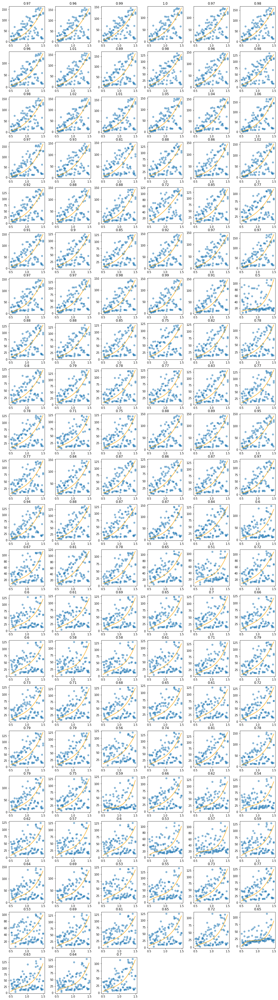

In [246]:
fig = plt.figure(figsize=(15,50))

for i, site in enumerate(sites):
    df_s = df_all[df_all.site == site]
    df_s.reset_index(inplace=True, drop=True)
    
    df_sc = df_s.groupby('cvar').mean().copy()
    x = df_sc.rmax_ltir
    y = df_sc.dm_ear
    mod_spline = interpolate.UnivariateSpline(x[x.argsort()], y[y.argsort()], s=1e10, k=3)
    yhat = mod_spline(x)
    x_mod = np.arange(0.5, 1.5, 0.01)
    y_mod = mod_spline(x_mod)
    var = round(y.var()/(y-yhat).var(),2)
#    var = round(yhat.var()/y.var(),2)
    ax = fig.add_subplot(22,6,i+1)
    ax.scatter(x, y, alpha=0.5)
    ax.plot(x_mod, y_mod, color='orange')
    ax.set_title(str(var))
fig.subplots_adjust(left=0.05, bottom=0, right=0.95, top=1, wspace=0.3, hspace=0.25)